Построить логистическическую регрессию, KNeighborsClassifier, DecisionTreeClassifier, сравнить
Метрика — accuracy

Для начала (чистА по-приколу построим предсказание цены на золото ⛹)
Качал я все это добро отсюда:
https://www.kaggle.com/datasets/jishnukoliyadan/gold-price-1979-present

In [101]:
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
matplotlib.style.use('ggplot')
%matplotlib inline
from sklearn.linear_model import LinearRegression
from scipy import stats
from sklearn.preprocessing import PolynomialFeatures
import statsmodels.api as sm
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import DecisionTreeClassifier
from IPython.display import Image
from sklearn.tree import export_graphviz
from subprocess import call
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import GridSearchCV, cross_val_score
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.datasets import load_digits


In [ ]:
! pip install pydot

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/ML/ML SEM 7/Monthly_Gold_Price_on_World.csv')
df = df.replace(np.nan, 0)
df

,Date,US dollar (USD),Euro (EUR),Japanese yen (JPY),Pound sterling (GBP),Canadian dollar (CAD),Swiss franc (CHF),Indian rupee (INR),Chinese renmimbi (CNY),Turkish lira (TRY),Saudi riyal (SAR),Indonesian rupiah (IDR),UAE dirham (AED),Thai baht THB),Vietnamese dong (VND),Egyptian pound (EGP),Korean won (KRW),Russian ruble (RUB),South African rand (ZAR),Australian dollar (AUD)
0,1979-01-31,233.70,144.84,45160.33,117.44,267.10,379.32,1840.82,0.00,0.00,745.20,139739.28,856.14,4511.27,0.00,0.00,108235.82,0.00,194.53,197.17
1,1979-02-28,251.30,154.64,50209.08,124.19,295.50,413.61,2011.68,0.00,0.00,827.84,154683.13,946.62,4985.70,0.00,0.00,119929.27,0.00,209.36,219.63
2,1979-03-30,240.10,148.04,50274.29,116.22,278.16,406.20,1940.16,0.00,0.00,796.73,148844.15,910.39,4812.88,0.00,0.00,116123.63,0.00,202.37,214.55
3,1979-04-30,245.30,152.76,54144.57,118.82,278.53,420.01,2013.10,0.00,0.00,819.39,152453.63,930.21,4890.99,0.00,0.00,117423.25,0.00,206.91,221.12
4,1979-05-31,274.60,172.00,61057.09,132.69,321.62,478.01,2253.41,0.00,0.00,933.26,171656.12,1048.41,5560.75,0.00,0.00,133889.58,0.00,233.65,250.72
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
513,2021-10-29,1769.15,1528.75,201727.32,1290.64,2192.95,1616.56,132476.16,11321.32,17010.64,6635.90,25064431.24,6498.35,58704.82,40250814.00,27793.34,2067340.12,125541.09,26891.08,2355.41
514,2021-11-30,1804.40,1603.06,204880.59,1363.87,2314.68,1669.79,135605.16,11496.10,23958.37,6769.39,25843517.60,6627.74,60803.77,40948149.18,28418.40,2143446.64,134213.52,28913.25,2544.81
515,2021-12-31,1805.85,1587.98,207952.67,1333.27,2281.06,1645.40,134239.04,11509.31,23981.24,6779.88,25737878.52,6632.98,60324.42,41155323.73,28369.91,2146704.30,135450.04,28821.37,2483.80
516,2022-01-31,1795.25,1601.47,206857.68,1338.09,2283.20,1671.47,133966.04,11427.39,24084.18,6735.60,25819285.50,6594.04,59772.85,40662412.50,28203.38,2164173.88,138983.77,27772.52,2548.08


In [ ]:
print ('Rows in the data frame: {0}'.format(len(df)))
print ('Rows without NAN: {0}'.format(len(df.dropna(how='any'))))

Rows in the data frame: 518
Rows without NAN: 518


In [ ]:
df.apply(lambda x: sum(x.isnull()), axis=0)

Date                        0
US dollar (USD)             0
Euro (EUR)                  0
Japanese yen (JPY)          0
Pound sterling (GBP)        0
Canadian dollar (CAD)       0
Swiss franc (CHF)           0
Indian rupee (INR)          0
Chinese renmimbi (CNY)      0
Turkish lira (TRY)          0
Saudi riyal (SAR)           0
Indonesian rupiah (IDR)     0
UAE dirham (AED)            0
Thai baht THB)              0
Vietnamese dong (VND)       0
Egyptian pound (EGP)        0
Korean won (KRW)            0
Russian ruble (RUB)         0
South African rand (ZAR)    0
Australian dollar (AUD)     0
dtype: int64

Fun fact: Россия, в лидерах по НЕзакупке золота

In [ ]:
del df['Russian ruble (RUB)']


Как говорится, рубль нужен для того, чтобы его убирали

In [ ]:
df

,Date,US dollar (USD),Euro (EUR),Japanese yen (JPY),Pound sterling (GBP),Canadian dollar (CAD),Swiss franc (CHF),Indian rupee (INR),Chinese renmimbi (CNY),Turkish lira (TRY),Saudi riyal (SAR),Indonesian rupiah (IDR),UAE dirham (AED),Thai baht THB),Vietnamese dong (VND),Egyptian pound (EGP),Korean won (KRW),South African rand (ZAR),Australian dollar (AUD)
0,1979-01-31,233.70,144.84,45160.33,117.44,267.10,379.32,1840.82,0.00,0.00,745.20,139739.28,856.14,4511.27,0.00,0.00,108235.82,194.53,197.17
1,1979-02-28,251.30,154.64,50209.08,124.19,295.50,413.61,2011.68,0.00,0.00,827.84,154683.13,946.62,4985.70,0.00,0.00,119929.27,209.36,219.63
2,1979-03-30,240.10,148.04,50274.29,116.22,278.16,406.20,1940.16,0.00,0.00,796.73,148844.15,910.39,4812.88,0.00,0.00,116123.63,202.37,214.55
3,1979-04-30,245.30,152.76,54144.57,118.82,278.53,420.01,2013.10,0.00,0.00,819.39,152453.63,930.21,4890.99,0.00,0.00,117423.25,206.91,221.12
4,1979-05-31,274.60,172.00,61057.09,132.69,321.62,478.01,2253.41,0.00,0.00,933.26,171656.12,1048.41,5560.75,0.00,0.00,133889.58,233.65,250.72
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
513,2021-10-29,1769.15,1528.75,201727.32,1290.64,2192.95,1616.56,132476.16,11321.32,17010.64,6635.90,25064431.24,6498.35,58704.82,40250814.00,27793.34,2067340.12,26891.08,2355.41
514,2021-11-30,1804.40,1603.06,204880.59,1363.87,2314.68,1669.79,135605.16,11496.10,23958.37,6769.39,25843517.60,6627.74,60803.77,40948149.18,28418.40,2143446.64,28913.25,2544.81
515,2021-12-31,1805.85,1587.98,207952.67,1333.27,2281.06,1645.40,134239.04,11509.31,23981.24,6779.88,25737878.52,6632.98,60324.42,41155323.73,28369.91,2146704.30,28821.37,2483.80
516,2022-01-31,1795.25,1601.47,206857.68,1338.09,2283.20,1671.47,133966.04,11427.39,24084.18,6735.60,25819285.50,6594.04,59772.85,40662412.50,28203.38,2164173.88,27772.52,2548.08


Теперь посмотрим на распределение в колонке USD 
Спойлер: там все странно

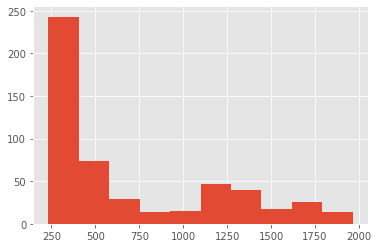

In [ ]:
df['US dollar (USD)'].hist() 

В данном случае, мы можем попробовать заменить данные на среднее (как это обернется узнаем далее)

In [ ]:
df['US dollar (USD)'] = df['US dollar (USD)'].fillna(df['US dollar (USD)'].mean())

In [ ]:
len(df.dropna())

518

После всех этих телодвижений, можем попробовать замутить модель

In [ ]:
X = df.drop(['US dollar (USD)','Date'], axis=1)
y = df['US dollar (USD)']

In [ ]:
model = LinearRegression()
model.fit(X, y)

LinearRegression()

Как мы видим, наша модель офигеть, как точна и доллар, как и другие валюты, в целом, зависим

In [ ]:
print ('R^2: {0}'.format(model.score(X, y)))

R^2: 0.9999649079237651


Выведем регрессионные коэффициенты от метода model.coef_ и свободный член от метода model.intercept_.

In [ ]:
coef = pd.DataFrame(zip(['intercept'] + X.columns.tolist(), [model.intercept_] + model.coef_.tolist()),
                    columns=['predictor', 'coef'])
coef

,predictor,coef
0,intercept,-2.451704e+00
1,Euro (EUR),-1.351564e-02
2,Japanese yen (JPY),5.972814e-05
3,Pound sterling (GBP),-1.058474e-02
4,Canadian dollar (CAD),2.516631e-02
5,Swiss franc (CHF),2.340113e-02
6,Indian rupee (INR),-5.527757e-05
7,Chinese renmimbi (CNY),-7.661915e-04
8,Turkish lira (TRY),2.644754e-04
9,Saudi riyal (SAR),9.534809e-02


In [ ]:
def regression_coef(model, X, y):
    coef = pd.DataFrame(zip(['intercept'] + X.columns.tolist(), [model.intercept_] + model.coef_.tolist()),
                    columns=['predictor', 'coef'])
    X1 = np.append(np.ones((len(X),1)), X, axis=1)
    b = np.append(model.intercept_, model.coef_)
    MSE = np.sum((model.predict(X) - y) ** 2, axis=0) / float(X.shape[0] - X.shape[1])
    var_b = MSE * (np.linalg.inv(np.dot(X1.T, X1)).diagonal())
    sd_b = np.sqrt(var_b)
    t = b / sd_b
    coef['pvalue'] = [2 * (1 - stats.t.cdf(np.abs(i), (len(X1) - 1))) for i in t]
    return coef
regression_coef(model, X, y)

,predictor,coef,pvalue
0,intercept,-2.451704e+00,1.320628e-02
1,Euro (EUR),-1.351564e-02,1.835486e-02
2,Japanese yen (JPY),5.972814e-05,9.026557e-03
3,Pound sterling (GBP),-1.058474e-02,1.146636e-01
4,Canadian dollar (CAD),2.516631e-02,3.304091e-07
5,Swiss franc (CHF),2.340113e-02,1.530069e-10
6,Indian rupee (INR),-5.527757e-05,4.393274e-01
7,Chinese renmimbi (CNY),-7.661915e-04,6.707200e-02
8,Turkish lira (TRY),2.644754e-04,2.159353e-02
9,Saudi riyal (SAR),9.534809e-02,0.000000e+00


In [ ]:
df.corr()

,US dollar (USD),Euro (EUR),Japanese yen (JPY),Pound sterling (GBP),Canadian dollar (CAD),Swiss franc (CHF),Indian rupee (INR),Chinese renmimbi (CNY),Turkish lira (TRY),Saudi riyal (SAR),Indonesian rupiah (IDR),UAE dirham (AED),Thai baht THB),Vietnamese dong (VND),Egyptian pound (EGP),Korean won (KRW),South African rand (ZAR),Australian dollar (AUD)
US dollar (USD),1.000000,0.981523,0.893886,0.982239,0.977820,0.952919,0.963341,0.946345,0.773090,0.999600,0.953676,0.999967,0.983998,0.975615,0.864879,0.987706,0.928791,0.960032
Euro (EUR),0.981523,1.000000,0.903043,0.994137,0.990086,0.950504,0.978724,0.933520,0.822858,0.981774,0.971942,0.981129,0.974891,0.973312,0.906946,0.981951,0.962672,0.979637
Japanese yen (JPY),0.893886,0.903043,1.000000,0.888515,0.903157,0.957203,0.851342,0.734492,0.770270,0.883667,0.850882,0.894716,0.847769,0.822609,0.814298,0.853956,0.853384,0.866567
Pound sterling (GBP),0.982239,0.994137,0.888515,1.000000,0.992620,0.939321,0.981433,0.942850,0.829212,0.983100,0.972910,0.981929,0.971970,0.977081,0.923228,0.983161,0.965530,0.983751
Canadian dollar (CAD),0.977820,0.990086,0.903157,0.992620,1.000000,0.933326,0.985782,0.937608,0.845881,0.977971,0.981516,0.977735,0.971296,0.973030,0.931494,0.977455,0.978355,0.991289
Swiss franc (CHF),0.952919,0.950504,0.957203,0.939321,0.933326,1.000000,0.886944,0.827213,0.737940,0.946317,0.880492,0.953112,0.913486,0.885561,0.808815,0.926821,0.864962,0.903232
Indian rupee (INR),0.963341,0.978724,0.851342,0.981433,0.985782,0.886944,1.000000,0.959428,0.858511,0.966357,0.994462,0.962977,0.974703,0.987890,0.938527,0.974808,0.987423,0.987118
Chinese renmimbi (CNY),0.946345,0.933520,0.734492,0.942850,0.937608,0.827213,0.959428,1.000000,0.752615,0.953673,0.953910,0.945632,0.971292,0.981385,0.864947,0.965711,0.923980,0.946865
Turkish lira (TRY),0.773090,0.822858,0.770270,0.829212,0.845881,0.737940,0.858511,0.752615,1.000000,0.773837,0.852726,0.772923,0.774176,0.794019,0.901121,0.785663,0.889545,0.863696
Saudi riyal (SAR),0.999600,0.981774,0.883667,0.983100,0.977971,0.946317,0.966357,0.953673,0.773837,1.000000,0.956731,0.999503,0.986425,0.979343,0.867135,0.989602,0.931412,0.962611


In [ ]:
regression_coef(model, X, y)

,predictor,coef,pvalue
0,intercept,-2.451704e+00,1.320628e-02
1,Euro (EUR),-1.351564e-02,1.835486e-02
2,Japanese yen (JPY),5.972814e-05,9.026557e-03
3,Pound sterling (GBP),-1.058474e-02,1.146636e-01
4,Canadian dollar (CAD),2.516631e-02,3.304091e-07
5,Swiss franc (CHF),2.340113e-02,1.530069e-10
6,Indian rupee (INR),-5.527757e-05,4.393274e-01
7,Chinese renmimbi (CNY),-7.661915e-04,6.707200e-02
8,Turkish lira (TRY),2.644754e-04,2.159353e-02
9,Saudi riyal (SAR),9.534809e-02,0.000000e+00


Попробуем сделать прогноз временных рядов !

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/ML/ML SEM 7/Monthly_Gold_Price_on_World.csv')
df = df.replace(np.nan, 0)
df

,Date,US dollar (USD),Euro (EUR),Japanese yen (JPY),Pound sterling (GBP),Canadian dollar (CAD),Swiss franc (CHF),Indian rupee (INR),Chinese renmimbi (CNY),Turkish lira (TRY),Saudi riyal (SAR),Indonesian rupiah (IDR),UAE dirham (AED),Thai baht THB),Vietnamese dong (VND),Egyptian pound (EGP),Korean won (KRW),Russian ruble (RUB),South African rand (ZAR),Australian dollar (AUD)
0,1979-01-31,233.70,144.84,45160.33,117.44,267.10,379.32,1840.82,0.00,0.00,745.20,139739.28,856.14,4511.27,0.00,0.00,108235.82,0.00,194.53,197.17
1,1979-02-28,251.30,154.64,50209.08,124.19,295.50,413.61,2011.68,0.00,0.00,827.84,154683.13,946.62,4985.70,0.00,0.00,119929.27,0.00,209.36,219.63
2,1979-03-30,240.10,148.04,50274.29,116.22,278.16,406.20,1940.16,0.00,0.00,796.73,148844.15,910.39,4812.88,0.00,0.00,116123.63,0.00,202.37,214.55
3,1979-04-30,245.30,152.76,54144.57,118.82,278.53,420.01,2013.10,0.00,0.00,819.39,152453.63,930.21,4890.99,0.00,0.00,117423.25,0.00,206.91,221.12
4,1979-05-31,274.60,172.00,61057.09,132.69,321.62,478.01,2253.41,0.00,0.00,933.26,171656.12,1048.41,5560.75,0.00,0.00,133889.58,0.00,233.65,250.72
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
513,2021-10-29,1769.15,1528.75,201727.32,1290.64,2192.95,1616.56,132476.16,11321.32,17010.64,6635.90,25064431.24,6498.35,58704.82,40250814.00,27793.34,2067340.12,125541.09,26891.08,2355.41
514,2021-11-30,1804.40,1603.06,204880.59,1363.87,2314.68,1669.79,135605.16,11496.10,23958.37,6769.39,25843517.60,6627.74,60803.77,40948149.18,28418.40,2143446.64,134213.52,28913.25,2544.81
515,2021-12-31,1805.85,1587.98,207952.67,1333.27,2281.06,1645.40,134239.04,11509.31,23981.24,6779.88,25737878.52,6632.98,60324.42,41155323.73,28369.91,2146704.30,135450.04,28821.37,2483.80
516,2022-01-31,1795.25,1601.47,206857.68,1338.09,2283.20,1671.47,133966.04,11427.39,24084.18,6735.60,25819285.50,6594.04,59772.85,40662412.50,28203.38,2164173.88,138983.77,27772.52,2548.08


In [ ]:
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%M-%d')
df

,Date,US dollar (USD),Euro (EUR),Japanese yen (JPY),Pound sterling (GBP),Canadian dollar (CAD),Swiss franc (CHF),Indian rupee (INR),Chinese renmimbi (CNY),Turkish lira (TRY),Saudi riyal (SAR),Indonesian rupiah (IDR),UAE dirham (AED),Thai baht THB),Vietnamese dong (VND),Egyptian pound (EGP),Korean won (KRW),Russian ruble (RUB),South African rand (ZAR),Australian dollar (AUD)
0,1979-01-31 00:01:00,233.70,144.84,45160.33,117.44,267.10,379.32,1840.82,0.00,0.00,745.20,139739.28,856.14,4511.27,0.00,0.00,108235.82,0.00,194.53,197.17
1,1979-01-28 00:02:00,251.30,154.64,50209.08,124.19,295.50,413.61,2011.68,0.00,0.00,827.84,154683.13,946.62,4985.70,0.00,0.00,119929.27,0.00,209.36,219.63
2,1979-01-30 00:03:00,240.10,148.04,50274.29,116.22,278.16,406.20,1940.16,0.00,0.00,796.73,148844.15,910.39,4812.88,0.00,0.00,116123.63,0.00,202.37,214.55
3,1979-01-30 00:04:00,245.30,152.76,54144.57,118.82,278.53,420.01,2013.10,0.00,0.00,819.39,152453.63,930.21,4890.99,0.00,0.00,117423.25,0.00,206.91,221.12
4,1979-01-31 00:05:00,274.60,172.00,61057.09,132.69,321.62,478.01,2253.41,0.00,0.00,933.26,171656.12,1048.41,5560.75,0.00,0.00,133889.58,0.00,233.65,250.72
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
513,2021-01-29 00:10:00,1769.15,1528.75,201727.32,1290.64,2192.95,1616.56,132476.16,11321.32,17010.64,6635.90,25064431.24,6498.35,58704.82,40250814.00,27793.34,2067340.12,125541.09,26891.08,2355.41
514,2021-01-30 00:11:00,1804.40,1603.06,204880.59,1363.87,2314.68,1669.79,135605.16,11496.10,23958.37,6769.39,25843517.60,6627.74,60803.77,40948149.18,28418.40,2143446.64,134213.52,28913.25,2544.81
515,2021-01-31 00:12:00,1805.85,1587.98,207952.67,1333.27,2281.06,1645.40,134239.04,11509.31,23981.24,6779.88,25737878.52,6632.98,60324.42,41155323.73,28369.91,2146704.30,135450.04,28821.37,2483.80
516,2022-01-31 00:01:00,1795.25,1601.47,206857.68,1338.09,2283.20,1671.47,133966.04,11427.39,24084.18,6735.60,25819285.50,6594.04,59772.85,40662412.50,28203.38,2164173.88,138983.77,27772.52,2548.08


Text(0, 0.5, 'log10 от цены за слиток')

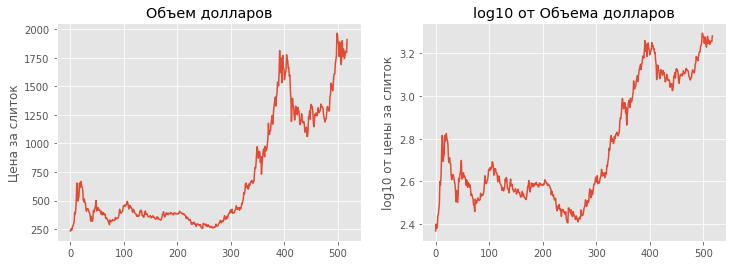

In [ ]:
fig = plt.figure(figsize=(12, 4))
ax1 = fig.add_subplot(121)
df['US dollar (USD)'].plot(ax=ax1)
ax1.set_title(u'Объем долларов')
ax1.set_ylabel(u'Цена за слиток')

ax2 = fig.add_subplot(122)
pd.Series(np.log10(df['US dollar (USD)'])).plot(ax=ax2)
ax2.set_title(u'log10 от Объема долларов')
ax2.set_ylabel(u'log10 от цены за слиток')


Вывод: будем строить модель линейной регрессии для приближения логарифма от объёма перевозок. То есть
logyi=βxi+c(xi)+εi,
где yi -- объём перевозок, xi -- порядковый номер месяца, c(xi) -- сезонная составляющая, εi -- случайный шум.

Для удобства дальнейшего использования создадим дополнительно 12 новых месяцев для построения прогноза на них. Для этого создадим эти 12 новых дат с помощью функции pd.date_range. Данный объект будет объектом класса DateTimeIndex (наследованный от класса Index), и чтобы объединить их с колонкой df['date'], принадлежащей классу datetime64, придётся привести последнюю к классу Index. Объединим два набора дат и сохраним их в объекте new_dates.

Далее создадим фиктивный датафрейм df2, состоящий из одной колонки с этими новыми датами, и приклеим его к исходному датафрейму df с помозью функции pd.merge. Эта функция склеивает два датасета по указанному набору колонок (параметр on) и по указанному правилу склейки (параметр how). В on указываем одну общую колонку date, по которой нужно произвести склейку. В how указываем right, что означает следующее: возьми весь правый датасет и приклей к нему левый датасет по условию совпадения значений колонки on, а в случае если для значений из правой колонки on не найдётся соотвествующих значений в левой колонке on, то тогда приклей NaN значения. Вообще говоря, опция how соответствует опциям JOIN в языке SQL (LEFT JOIN, RIGHT_JOIN, INNER JOIN, OUTER_JOIN).

In [ ]:
# Создаём последовательсть месяцев. freq='MS' означает первое число каждого месяца из указанного диапазона дат
new_dates = pd.date_range('1980-01-01', '1995-12-01', freq='MS')
# Приводим df['date'] к типу Index, объединяем с 12 месяцами, полученными на предыдущем шаге
new_dates = pd.Index(df['Date']) | new_dates
# Создаём датафрейм из одной колонки с расширенным набором дат
df2 = pd.DataFrame({'Date': new_dates})
# Объединяем два датафрейма по колонке 'date'.
df = pd.merge(df, df2, on='Date', how='right')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: FutureWarning: Index.__or__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__or__.  Use index.union(other) instead
  after removing the cwd from sys.path.


Создадим регрессионную переменную ```month_num``` -- порядковый номер пары (месяц, год). И прологарифмируем таргет.

In [ ]:
df['month_num'] = range(1, len(df) + 1)
df['log_y'] = np.log10(df['US dollar (USD)'])

In [ ]:
df['log_y'] = df['log_y'].replace(np.nan, 0)
df['log_y']

0      0.000000
1      0.000000
2      0.000000
3      0.000000
4      0.000000
         ...   
741    3.278742
742    3.258841
743    3.256682
744    3.280999
745    3.254125
Name: log_y, Length: 746, dtype: float64

Создадим 12 колонок season_1, season_2, ..., season_12, в которые поместим индикаторы соответствующего месяца. Чтобы достать порядковый номер месяца в каждой строчке, применим последовательно пару методов dt и month к колонке df['date']. Внутри цикла будем проверять, равен ли очередной месяц текущему значению из цикла.

In [ ]:
for x in range(1, 13):
    df['season_' + str(x)] = df['Date'].dt.month == x

Правда, для устранения линейной зависимости между колонками, один из сезонных индикаторов придётся исключить. Пусть базовым месяцем будет январь.

In [ ]:
# xrange(2, 13) соответствует всем месяцам с февраля по декабрь
season_columns = ['season_' + str(x) for x in range(2, 13)]

# Создадим объекты матрицу X и вектор y для обучения модели
X = df[['month_num'] + season_columns]
y = df['log_y']

# Оставим только те строчки, у которых известны значения y (с номером < 200)
X1 = X[X.index < 200]
y1 = y[y.index < 200]

In [ ]:
X1

,month_num,season_2,season_3,season_4,season_5,season_6,season_7,season_8,season_9,season_10,season_11,season_12
0,1,False,False,False,False,False,False,False,False,False,False,False
1,2,True,False,False,False,False,False,False,False,False,False,False
2,3,False,True,False,False,False,False,False,False,False,False,False
3,4,False,False,True,False,False,False,False,False,False,False,False
4,5,False,False,False,True,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...
195,196,False,False,False,False,False,False,False,False,False,False,False
196,197,False,False,False,False,False,False,False,False,False,False,False
197,198,False,False,False,False,False,False,False,False,False,False,False
198,199,False,False,False,False,False,False,False,False,False,False,False


In [ ]:
model = LinearRegression()
model.fit(X1, y1)

LinearRegression()

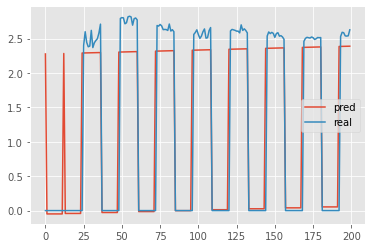

In [ ]:
pred = pd.DataFrame({
    'pred': model.predict(X1),
    'real': y1})
pred.plot()

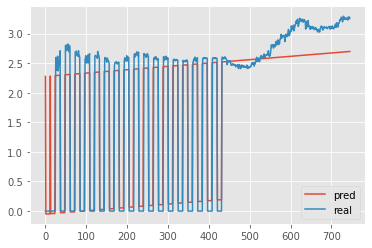

In [ ]:
pred = pd.DataFrame({
    'pred': model.predict(X),
    'real': y})
pred.plot()

ЧАСТЬ 2 

---

# kNN & DTree

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/ML/ML SEM 7/diabetes.csv')
df

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101,76,48,180,32.9,0.171,63,0
764,2,122,70,27,0,36.8,0.340,27,0
765,5,121,72,23,112,26.2,0.245,30,0
766,1,126,60,0,0,30.1,0.349,47,1


In [ ]:
df.sort_values('Age')

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
255,1,113,64,35,0,33.6,0.543,21,1
60,2,84,0,0,0,0.0,0.304,21,0
102,0,125,96,0,0,22.5,0.262,21,0
182,1,0,74,20,23,27.7,0.299,21,0
623,0,94,70,27,115,43.5,0.347,21,0
...,...,...,...,...,...,...,...,...,...
123,5,132,80,0,0,26.8,0.186,69,0
684,5,136,82,0,0,0.0,0.640,69,0
666,4,145,82,18,0,32.5,0.235,70,1
453,2,119,0,0,0,19.6,0.832,72,0


In [ ]:
age_tree = DecisionTreeClassifier(random_state=17)
age_tree.fit(df['Age'].values.reshape(-1, 1), df['Pregnancies'].values)

DecisionTreeClassifier(random_state=17)

In [ ]:
export_graphviz(age_tree,
                out_file='tree.dot',
                # задать названия фич
                # feature_names=X.columns,
                class_names=None,
                # показывать названия полей у численных значений внутри узла
                label='all',
                # раскрашивать узлы в цвет преобладающего класса
                filled=True,
                # показывать значение impurity для каждого узла
                impurity=True,
                # показывать номера узлов
                node_ids=True,
                # Показывать доли каждого класса в узлах (а не количество)
                proportion=True,
                # Повернуть дерево на 90 градусов (вертикальная ориентация)
                rotate=True,
                # Число точек после запятой для отображаемых дробей
                # precision=3
               )
!dot -Tpng tree.dot -o tree.png

Честно, вообще не представляю, что тут творится, но явно быть беременной и с диабетом - такое себе

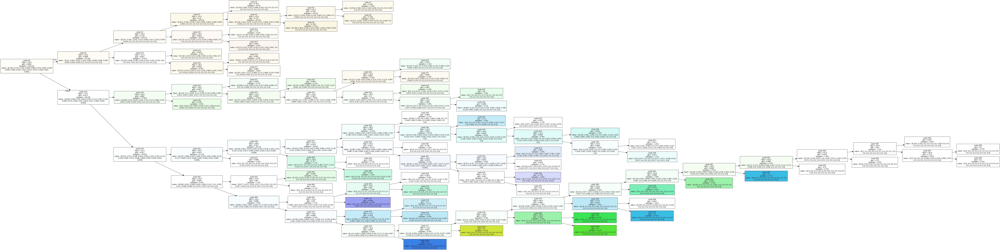

In [ ]:
Image("tree.png") 

Из-за такого объема, крайне сложно оценить, что тут так и не так, но мы можем поэкспериментировать

Загрузим наш датасет (на всякий пожарный) и попробуем уже взять не одно, а неск значений

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/ML/ML SEM 7/diabetes.csv')
df

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101,76,48,180,32.9,0.171,63,0
764,2,122,70,27,0,36.8,0.340,27,0
765,5,121,72,23,112,26.2,0.245,30,0
766,1,126,60,0,0,30.1,0.349,47,1


In [ ]:
age_sal_tree = DecisionTreeClassifier(random_state=17)
age_sal_tree.fit(df[['BloodPressure', 'Age']].values, df['SkinThickness'].values);

In [ ]:
export_graphviz(age_sal_tree,
                out_file='tree2.dot',
                # задать названия фич
                # feature_names=X.columns,
                class_names=None,
                # показывать названия полей у численных значений внутри узла
                label='all',
                # раскрашивать узлы в цвет преобладающего класса
                filled=True,
                # показывать значение impurity для каждого узла
                impurity=True,
                # показывать номера узлов
                node_ids=True,
                # Показывать доли каждого класса в узлах (а не количество)
                proportion=True,
                # Повернуть дерево на 90 градусов (вертикальная ориентация)
                rotate=True,
                # Число точек после запятой для отображаемых дробей
                # precision=3
               )
!dot -Tpng tree2.dot -o tree2.png

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.891546 to fit
tcmalloc: large alloc 1310162944 bytes == 0x55e16d1bc000 @  0x7f2a49eb4001 0x7f2a4614b1fa 0x7f2a4614b2ad 0x7f2a472d66df 0x7f2a477cd261 0x7f2a49c4a468 0x7f2a49c4cd53 0x55e16af2c092 0x7f2a495ffc87 0x55e16af2c12a


Если у вас долго грузится картинка - это совершенно нормально. У меня она вообще не загрузилась и комп от этого умер

In [ ]:
Image("tree2.png")

Результат исследований такой: В нашем случае, использовать или так много данных или вообще датасет не стоит, по крайней мере в **дереве решений**

При прогнозировании количественного признака идея построения дерева остается та же, но меняется критерий качества:

Дисперсия вокруг среднего: где – число объектов в листе, – значения целевого признака. Попросту говоря, минимизируя дисперсию вокруг среднего, мы ищем признаки, разбивающие выборку таким образом, что значения целевого признака в каждом листе примерно равны.

In [102]:
n_train = 150        
n_test = 1000       
noise = 0.1


def f(x):
    x = x.ravel()

    return np.exp(-x ** 2) + 1.5 * np.exp(-(x - 2) ** 2)

def generate(n_samples, noise):
    X = np.random.rand(n_samples) * 10 - 5
    X = np.sort(X).ravel()
    y = np.exp(-X ** 2) + 1.5 * np.exp(-(X - 2) ** 2) + \
        np.random.normal(0.0, noise, n_samples)
    X = X.reshape((n_samples, 1))

    return X, y

X_train, y_train = generate(n_samples=n_train, noise=noise)
X_test, y_test = generate(n_samples=n_test, noise=noise)

In [103]:
reg_tree = DecisionTreeRegressor(max_depth=5, random_state=17)

reg_tree.fit(X_train, y_train)
reg_tree_pred = reg_tree.predict(X_test)

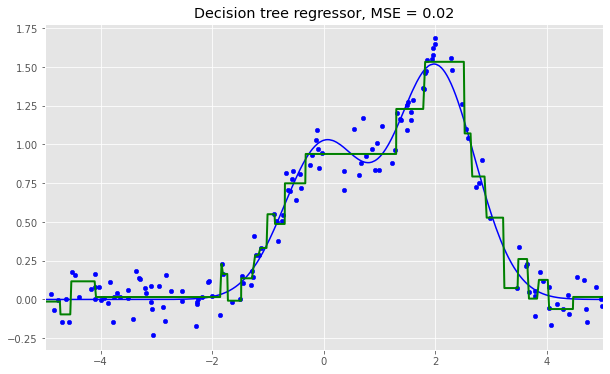

In [104]:
plt.figure(figsize=(10, 6))
plt.plot(X_test, f(X_test), "b")
plt.scatter(X_train, y_train, c="b", s=20)
plt.plot(X_test, reg_tree_pred, "g", lw=2)
plt.xlim([-5, 5])
plt.title("Decision tree regressor, MSE = %.2f" % (np.sum((y_test - reg_tree_pred) ** 2) / n_test))
plt.show()

Деревья решений и метод ближайших соседей в задаче прогнозирования диабета

In [105]:
df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/ML/ML SEM 7/diabetes.csv')
df

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101,76,48,180,32.9,0.171,63,0
764,2,122,70,27,0,36.8,0.340,27,0
765,5,121,72,23,112,26.2,0.245,30,0
766,1,126,60,0,0,30.1,0.349,47,1


Как бы забавно это не было, но сегодня, в данном случае, лучше ничего не удалять и ничего не изменять

In [106]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


In [107]:
y = df['Outcome'].astype('int')

In [108]:
X = df.drop('Outcome', axis=1)

In [109]:
X_train, X_holdout, y_train, y_holdout = train_test_split(df.values, y, test_size=0.3,
                                                          random_state=17)

In [110]:
X_train.shape, X_holdout.shape

((537, 9), (231, 9))

Обучим 2 модели – дерево решений и kNN, пока не знаем, какие параметры хороши, поэтому наугад: глубину дерева берем 5, число ближайших соседей – 10

In [111]:
tree = DecisionTreeClassifier(max_depth=5, random_state=17)
knn = KNeighborsClassifier(n_neighbors=10)

In [112]:
%%time
tree.fit(X_train, y_train)

CPU times: user 3.96 ms, sys: 0 ns, total: 3.96 ms
Wall time: 6.79 ms


DecisionTreeClassifier(max_depth=5, random_state=17)

In [113]:
%%time
knn.fit(X_train, y_train)

CPU times: user 3.3 ms, sys: 1.03 ms, total: 4.33 ms
Wall time: 16.4 ms


KNeighborsClassifier(n_neighbors=10)

Качество прогнозов будем проверять с помощью простой метрики – доли правильных ответов

In [114]:
tree_pred = tree.predict(X_holdout)
accuracy_score(y_holdout, tree_pred)

1.0

In [115]:
knn_pred = knn.predict(X_holdout)
accuracy_score(y_holdout, knn_pred)

0.7445887445887446

Теперь настроим параметры дерева на кросс-валидации. Настраивать будем максимальную глубину и максимальное используемое на каждом разбиении число признаков. Суть того, как работает GridSearchCV: для каждой уникальной пары значений параметров max_depth и max_features будет проведена 5-кратная кросс-валидация и выберется лучшее сочетание параметров.

In [117]:
tree_params = {'max_depth': range(1,11),
               'max_features': range(4,19)}

tree_grid = GridSearchCV(tree, tree_params,
                         cv=5, n_jobs=-1,
                        verbose=True)

In [118]:
tree_grid.fit(X_train, y_train) 

Fitting 5 folds for each of 150 candidates, totalling 750 fits


/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:372: FitFailedWarning: 
450 fits failed out of a total of 750.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
450 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.7/dist-packages/sklearn/tree/_classes.py", line 942, in fit
    X_idx_sorted=X_idx_sorted,
  File "/usr/local/lib/python3.7/dist-packages/sklearn/tree/_classes.py", line 308, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0

GridSearchCV(cv=5,
             estimator=DecisionTreeClassifier(max_depth=5, random_state=17),
             n_jobs=-1,
             param_grid={'max_depth': range(1, 11),
                         'max_features': range(4, 19)},
             verbose=True)

Смотрим на некоторые данные заранее

In [119]:
tree_grid.best_params_

{'max_depth': 1, 'max_features': 9}

In [120]:
tree_grid.best_score_

1.0

In [121]:
accuracy_score(y_holdout, tree_grid.predict(X_holdout))

1.0

In [123]:
knn_pipe = Pipeline([('scaler', StandardScaler()), ('knn', KNeighborsClassifier(n_jobs=-1))])
knn_params = {'knn__n_neighbors': range(1, 10)}
knn_grid = GridSearchCV(knn_pipe, knn_params,
                         cv=5, n_jobs=-1,
                        verbose=True)

In [124]:
knn_grid.fit(X_train, y_train)

Fitting 5 folds for each of 9 candidates, totalling 45 fits


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('knn',
                                        KNeighborsClassifier(n_jobs=-1))]),
             n_jobs=-1, param_grid={'knn__n_neighbors': range(1, 10)},
             verbose=True)

In [125]:
knn_grid.best_params_, knn_grid.best_score_

({'knn__n_neighbors': 1}, 0.9925233644859814)

In [126]:
accuracy_score(y_holdout, knn_grid.predict(X_holdout))

0.9956709956709957

ОФФТОП


---

Деревья решений и метод ближайших соседей в задаче распознавания рукописных цифр MNIST

In [127]:
data = load_digits()
X, y = data.data, data.target
X[0,:].reshape([8,8])

array([[ 0.,  0.,  5., 13.,  9.,  1.,  0.,  0.],
       [ 0.,  0., 13., 15., 10., 15.,  5.,  0.],
       [ 0.,  3., 15.,  2.,  0., 11.,  8.,  0.],
       [ 0.,  4., 12.,  0.,  0.,  8.,  8.,  0.],
       [ 0.,  5.,  8.,  0.,  0.,  9.,  8.,  0.],
       [ 0.,  4., 11.,  0.,  1., 12.,  7.,  0.],
       [ 0.,  2., 14.,  5., 10., 12.,  0.,  0.],
       [ 0.,  0.,  6., 13., 10.,  0.,  0.,  0.]])

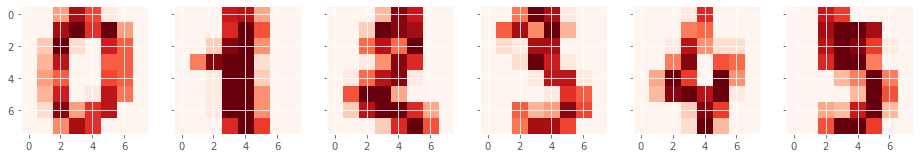

In [131]:
f, axes = plt.subplots(1, 6, sharey=True, figsize=(16,6))
for i in range(6):    
    axes[i].imshow(X[i,:].reshape([8,8]), cmap='Reds');

In [132]:
X_train, X_holdout, y_train, y_holdout = train_test_split(X, y, test_size=0.3,
                                                          random_state=17)

tree = DecisionTreeClassifier(max_depth=5, random_state=17)
knn = KNeighborsClassifier(n_neighbors=10)

In [133]:
%%time
tree.fit(X_train, y_train)

CPU times: user 16 ms, sys: 0 ns, total: 16 ms
Wall time: 22.2 ms


DecisionTreeClassifier(max_depth=5, random_state=17)

In [134]:
%%time
knn.fit(X_train, y_train)

CPU times: user 2.34 ms, sys: 18 µs, total: 2.35 ms
Wall time: 8.26 ms


KNeighborsClassifier(n_neighbors=10)

In [135]:
tree_pred = tree.predict(X_holdout)
knn_pred = knn.predict(X_holdout)
accuracy_score(y_holdout, knn_pred), accuracy_score(y_holdout, tree_pred)

(0.9740740740740741, 0.6666666666666666)

In [136]:
tree_params = {'max_depth': [1, 2, 3, 5, 10, 20, 25, 30, 40, 50, 64],
               'max_features': [1, 2, 3, 5, 10, 20 ,30, 50, 64]}

In [137]:
tree_grid = GridSearchCV(tree, tree_params,
                         cv=5, n_jobs=-1,
                        verbose=True)

In [138]:
tree_grid.fit(X_train, y_train)

Fitting 5 folds for each of 99 candidates, totalling 495 fits


GridSearchCV(cv=5,
             estimator=DecisionTreeClassifier(max_depth=5, random_state=17),
             n_jobs=-1,
             param_grid={'max_depth': [1, 2, 3, 5, 10, 20, 25, 30, 40, 50, 64],
                         'max_features': [1, 2, 3, 5, 10, 20, 30, 50, 64]},
             verbose=True)

In [139]:
tree_grid.best_params_, tree_grid.best_score_

({'max_depth': 10, 'max_features': 50}, 0.8568203376968316)

In [140]:
accuracy_score(y_holdout, tree_grid.predict(X_holdout))

0.8425925925925926

In [141]:
(cross_val_score(KNeighborsClassifier(n_neighbors=1), X_train, y_train, cv=5))

array([0.97222222, 0.98809524, 0.99203187, 0.99203187, 0.98804781])

In [142]:
np.mean(cross_val_score(KNeighborsClassifier(n_neighbors=1), X_train, y_train, cv=5))

0.9864858028204642

In [143]:
knn = KNeighborsClassifier(n_neighbors=1).fit(X_train, y_train)
accuracy_score(y_holdout, knn.predict(X_holdout))

0.9833333333333333